In [1]:
import tensorflow as tf
import tensorflow.keras as keras

from tensorflow.keras.layers import Dense, Input, Conv2D, MaxPool2D, AveragePooling2D, Flatten
from tensorflow.keras.models import Sequential

from tensorflow.keras import Model, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

from sklearn.model_selection import train_test_split

import cv2
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import os
import shutil
import math
import zipfile

In [2]:
import sys
IN_COLAB = 'google.colab' in sys.modules

if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')
    
    main_path = "/content/drive/MyDrive/DataScience/TrafficSignsRecognition"
else:
    main_path = os.getcwd().split("/code")[0]

In [3]:
def unzipFolders(file_path, destiny):
  with zipfile.ZipFile(file_path, "r") as z:
    z.extractall(destiny)

In [4]:
# unzipFolders(f"{main_path}/dataset/aerial-cars-dataset.zip", f"{main_path}/dataset")

In [15]:
def showImage(filename, path):
    
    txt_file = filename.split(".")[0] + ".txt"
    
    with open(path + '/' + txt_file, "r") as f:
        img_info_list = f.read().split("\n")[:-1]
    
    image = cv2.imread(path + '/' + filename)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_y, img_x, channels = image.shape
    

    for img_raw in img_info_list:

        img_info = img_raw.split(" ")
        
        img_class = int(img_info[0])
        x  = float(img_info[1])
        y  = float(img_info[2])
        width     = float(img_info[3])
        height    = float(img_info[4])

        n_width = math.ceil(width * img_x) // 2
        n_height = math.ceil(height * img_y) // 2    
        x = math.ceil(x * img_x) - n_width
        y = math.ceil(y * img_y) - n_height
        x2 = x + math.ceil(width * img_x)
        y2 = y + math.ceil(height * img_y)
        
        if img_class == 1:
            color = (255,0,0)
        elif img_class == 2:
            color = (0,255,0)
        else:
            color = (0,0,255)
    
        cv2.rectangle(image, (x, y), (x2, y2) , color, 2)
        print(img_info)


    plt.figure(figsize=(100,50))
    plt.imshow(image,vmin=0,vmax=255)
    plt.show()

(1080, 1920, 3)
['2', '0.160416666667', '0.64212962963', '0.11875', '0.0527777777778']
['0', '0.28515625', '0.643055555556', '0.0442708333333', '0.0324074074074']
['0', '0.289322916667', '0.597685185185', '0.0463541666667', '0.0342592592593']
['0', '0.2234375', '0.590277777778', '0.0458333333333', '0.037962962963']
['0', '0.163020833333', '0.586111111111', '0.040625', '0.0333333333333']
['3', '0.0723958333333', '0.584259259259', '0.0541666666667', '0.037037037037']
['3', '0.22421875', '0.505555555556', '0.0526041666667', '0.037037037037']
['0', '0.333333333333', '0.459722222222', '0.040625', '0.0435185185185']
['0', '0.571614583333', '0.458796296296', '0.0182291666667', '0.0583333333333']
['0', '0.531770833333', '0.441666666667', '0.0177083333333', '0.0740740740741']
['0', '0.4328125', '0.371296296296', '0.0364583333333', '0.0740740740741']
['0', '0.469791666667', '0.252314814815', '0.0229166666667', '0.0694444444444']
['0', '0.4921875', '0.0625', '0.0208333333333', '0.0712962962963']


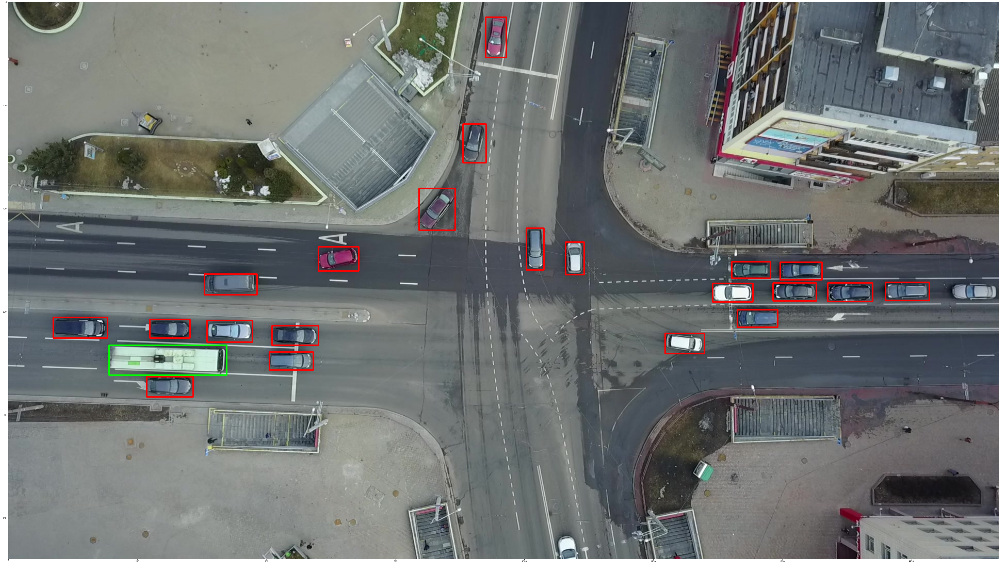

In [16]:
showImage("DJI_0005-0018.jpg", f"{main_path}/dataset/aerial-cars-dataset/data")

In [7]:
# FUNCTION THAT CALCULATE THE IOU, THESE FUNCTION RETURN A VALUE NEAR TO 1 THE PREDICTED SQUARE IS ON THE DATASET
# SQUARE OR 1 IF IS EXACLY EQUAL TO THE DATASET SQUARE
def get_iou(bb1, bb2):
    assert bb1['x1'] < bb1['x2']
    assert bb1['y1'] < bb1['y2']
    assert bb2['x1'] < bb2['x2']
    assert bb2['y1'] < bb2['y2']

    x_left   = max(bb1['x1'], bb2['x1'])
    y_top    = max(bb1['y1'], bb2['y1'])
    x_right  = min(bb1['x2'], bb2['x2'])
    y_bottom = min(bb1['y2'], bb2['y2'])

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    bb1_area = (bb1['x2'] - bb1['x1']) * (bb1['y2'] - bb1['y1'])
    bb2_area = (bb2['x2'] - bb2['x1']) * (bb2['y2'] - bb2['y1'])

    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
    
    assert iou >= 0.0
    assert iou <= 1.0
    
    return iou

In [12]:
cv2.setUseOptimized(True);
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

def ImagePreProcessor(filename, path, pre_folder, counter_car, counter_none):
    
    print(f"Processing {filename} image ...")
    img_path_list = []
    txt_file = filename.split(".")[0] + ".txt"
    
    with open(path + '/' + txt_file, "r") as f:
        img_info_list = f.read().split("\n")[:-1]
    
    image = cv2.imread(path + '/' + filename)
    img_y, img_x, channels = image.shape

    signs_coords = []

    for img_raw in img_info_list:

        img_info = img_raw.split(" ")
        
        img_class = int(img_info[0])
        x  = float(img_info[1])
        y  = float(img_info[2])
        width     = float(img_info[3])
        height    = float(img_info[4])

        n_width = math.ceil(width * img_x) // 2
        n_height = math.ceil(height * img_y) // 2    
        x = math.ceil(x * img_x) - n_width
        y = math.ceil(y * img_y) - n_height
        x2 = x + math.ceil(width * img_x)
        y2 = y + math.ceil(height * img_y)
        signs_coords.append({"cl":img_class, "coord":{'x1':x, 'x2':x2, 'y1':y, 'y2':y2}})
        
    # OPENCV SEARCH BY POSSIBLE OBJS
    ss.setBaseImage(image)
#     ss.switchToSelectiveSearchFast()
    ss.switchToSelectiveSearchQuality()
    results = ss.process()
    
    img_temp = image.copy()
    
    finish_flag = 0
    counter_true = 0
    total_true_flag = 0
    counter_false = 0
    total_false_flag = 0
    
    for e, new_coords in enumerate(results):
        if e < 3000 and finish_flag == 0:
            for coords in signs_coords:
                x, y, w, h = new_coords
                
                iou = get_iou(coords["coord"], {"x1":x, "x2":x+w, "y1":y, "y2":y+h})      
                

                if counter_true < 35:
                    if iou > 0.7:
                        # SAVE THE IMAGE AS THAT CLASS
                        img_slice = img_temp[y:y+h, x:x+w]
                        img_resized = cv2.resize(img_slice, (224, 224), interpolation=cv2.INTER_AREA)
                        full_filename = f"{pre_folder}/car_{counter_car}.jpg"
                        cv2.imwrite(full_filename, img_resized)
                        img_path_list.append(full_filename)
                        counter_car += 1
                        counter_true += 1
                else:
                    total_true_flag = 1
                    
                if counter_false < 35:
                    if iou < 0.2:
                        # SAVE IMAGES FALSE IMAGES TO TRAIN
                        img_slice = img_temp[y:y+h, x:x+w]
                        img_resized = cv2.resize(img_slice, (224, 224), interpolation=cv2.INTER_AREA)
                        full_filename = f"{pre_folder}/None_{counter_none}.jpg"
                        cv2.imwrite(full_filename, img_resized)
                        img_path_list.append(full_filename)
                        counter_none += 1
                        counter_false += 1
                else:
                    total_false_flag = 1
                    
            if total_true_flag == 1 and total_false_flag == 1:
                print("Total of 30 images of each type reached.")
                finish_flag = 1
                
    
    return (img_path_list, counter_car, counter_none)

In [9]:
# RUN THE IMAGE PREPROCESS ON ALL AIRPLANES IMAGES DATASET AND SAVE THE VECTOR OF IMAGES PATH 
def runImagePre(path):
    new_image_path = main_path + "/dataset/aerial-cars-dataset/preImages"
    
    try:
        os.mkdir(new_image_path)
    except Exception as e:
        print(f"Error: {e}")
        
    images_list = []
    
    counter_car  = 0
    counter_none = 0
    
    for e, filename in enumerate(os.listdir(path)):
        try:
            if ".jpg" in filename:
                temp_images, counter_car, counter_none = ImagePreProcessor(filename, path, new_image_path, counter_car, counter_none)
                images_list += temp_images
                print(f"Number of cars: {counter_car}")
                print()
        except Exception as e:
            print(f"Error: {e}")
            continue
        
    return images_list

In [ ]:
img_list = runImagePre(f"{main_path}/dataset/aerial-cars-dataset/data")